In [1]:
import os
import sys
import ruamel.yaml as yaml


In [2]:

sys.path.append("/home/ber0061/Repositories/surrDAMH")

In [4]:
from surrDAMH.modules import visualization_and_analysis as va
from surrDAMH.modules import analysis as ape
import matplotlib.pyplot as plt
import numpy as np

In [14]:
no_samplers = 19
conf_path = "config_mcmc_bayes.yaml"
basename = os.path.basename(conf_path)
problem_name, fext = os.path.splitext(basename)

In [15]:
output_dir = os.path.join(".", 'saved_samples', problem_name)
raw_data_dir = os.path.join(output_dir, 'raw_data')
visualization_dir = os.path.join(output_dir, 'img_Bayes')

In [16]:

with open(conf_path) as f:
    conf = yaml.safe_load(f)

no_stages = len(conf["samplers_list"])
# parameter chains_disp selects samples from 2. and 3. stage
chains_disp = range(no_samplers, no_samplers * no_stages)
print("chains_disp", chains_disp)

observations = np.array(conf["problem_parameters"]["observations"])

par_names = [p["name"] for p in conf["transformations"]]
print("parameters:", par_names)

if not os.path.exists(visualization_dir):
    os.makedirs(visualization_dir)


chains_disp range(19, 38)
parameters: ['storativity', 'young_modulus', 'init_stress_x', 'init_stress_y', 'perm_kr', 'perm_km', 'perm_beta', 'perm_gamma']


raw data: no_stages 2
raw data: no_chains 19
raw data: no_samples 512563
raw data: no_nonconverging 0
raw data: p (512563, 8)
raw data: w (512563, 1)
raw_data: np.sum(weights): 507951
filter raw data: p (32106, 8)
filter raw data: p (5606, 8)
[{'t': 'rejected', 'n': 96.87344091336281}, {'t': 'rejected', 'n': 96.96530304165663}, {'t': 'accepted', 'n': 97.00558377475859}, {'t': 'rejected', 'n': 97.17310001815359}, {'t': 'rejected', 'n': 97.18441768930055}, {'t': 'accepted', 'n': 97.22510208934727}, {'t': 'accepted', 'n': 97.28140002089165}, {'t': 'rejected', 'n': 97.30214624341254}, {'t': 'rejected', 'n': 97.31236073255705}, {'t': 'accepted', 'n': 97.31441483863117}, {'t': 'accepted', 'n': 97.32031397406405}, {'t': 'rejected', 'n': 97.43099121742428}, {'t': 'rejected', 'n': 97.45967486116504}, {'t': 'accepted', 'n': 97.49189388772095}, {'t': 'accepted', 'n': 97.50072077733579}, {'t': 'accepted', 'n': 97.55007466362831}, {'t': 'accepted', 'n': 97.58025682832233}, {'t': 'rejected', 'n': 97

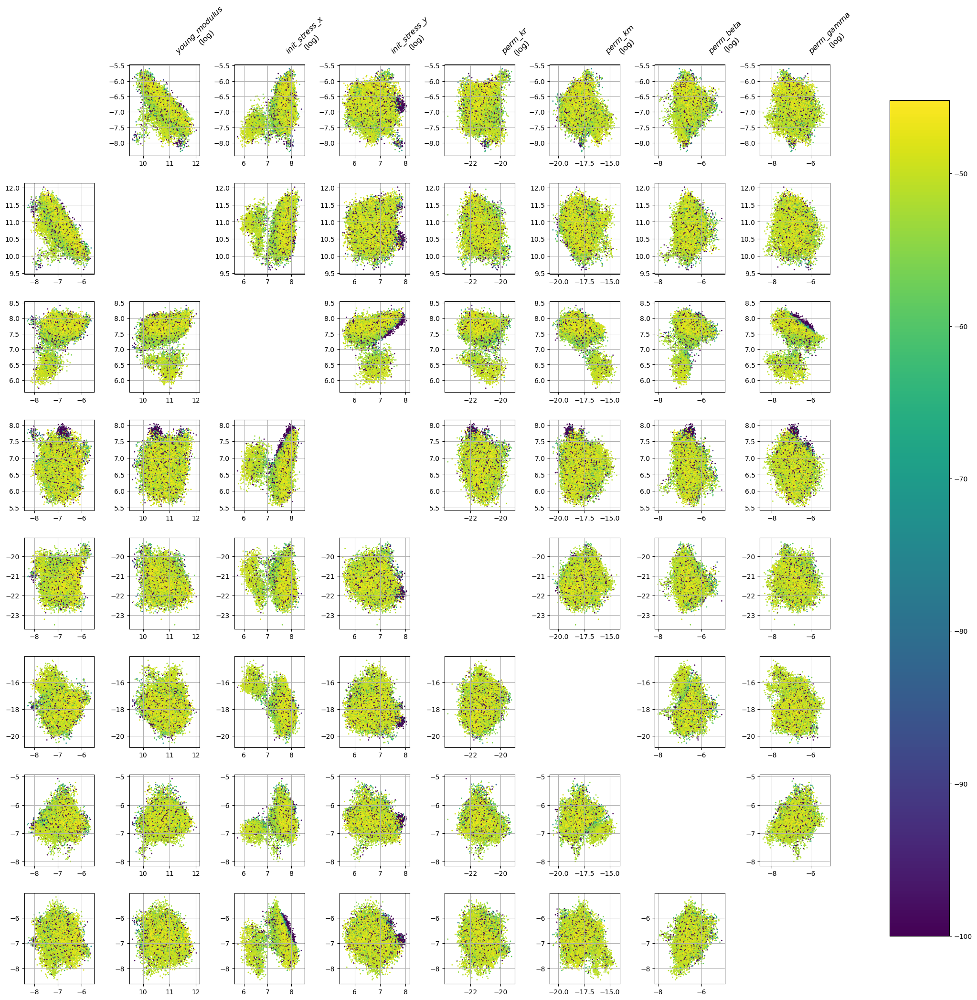

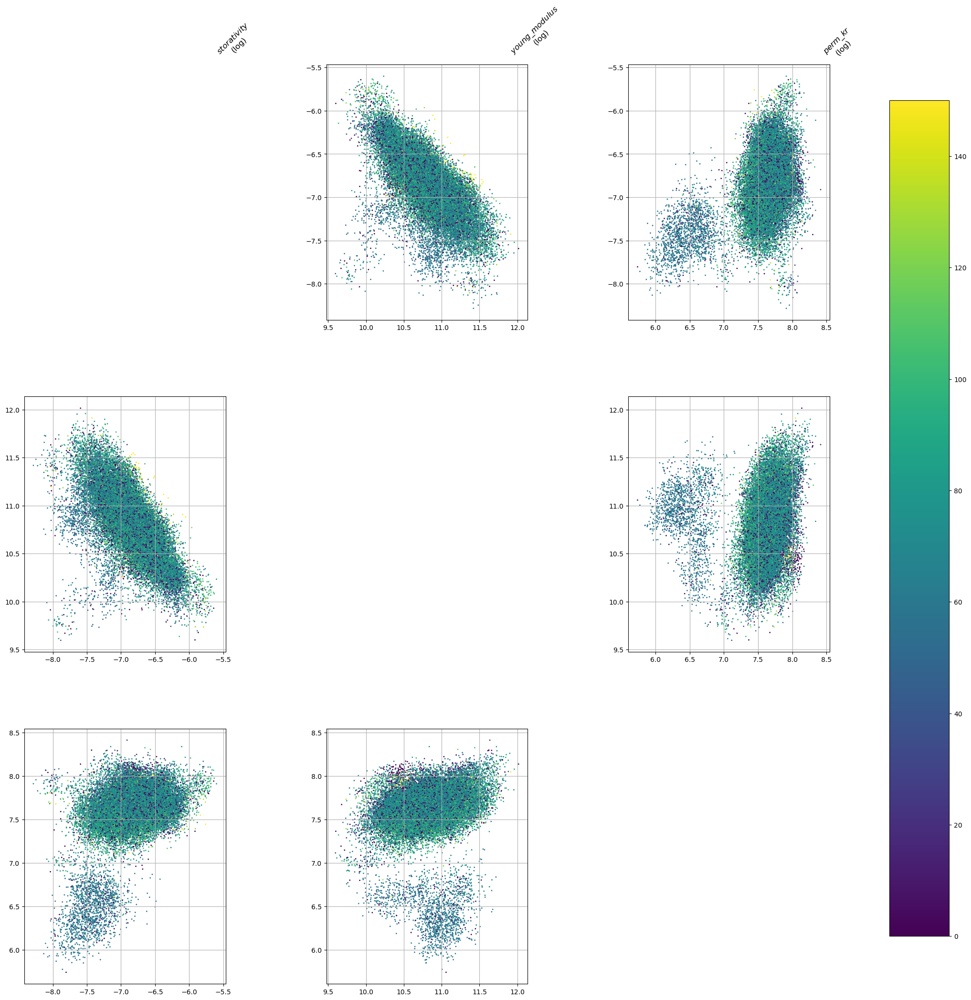

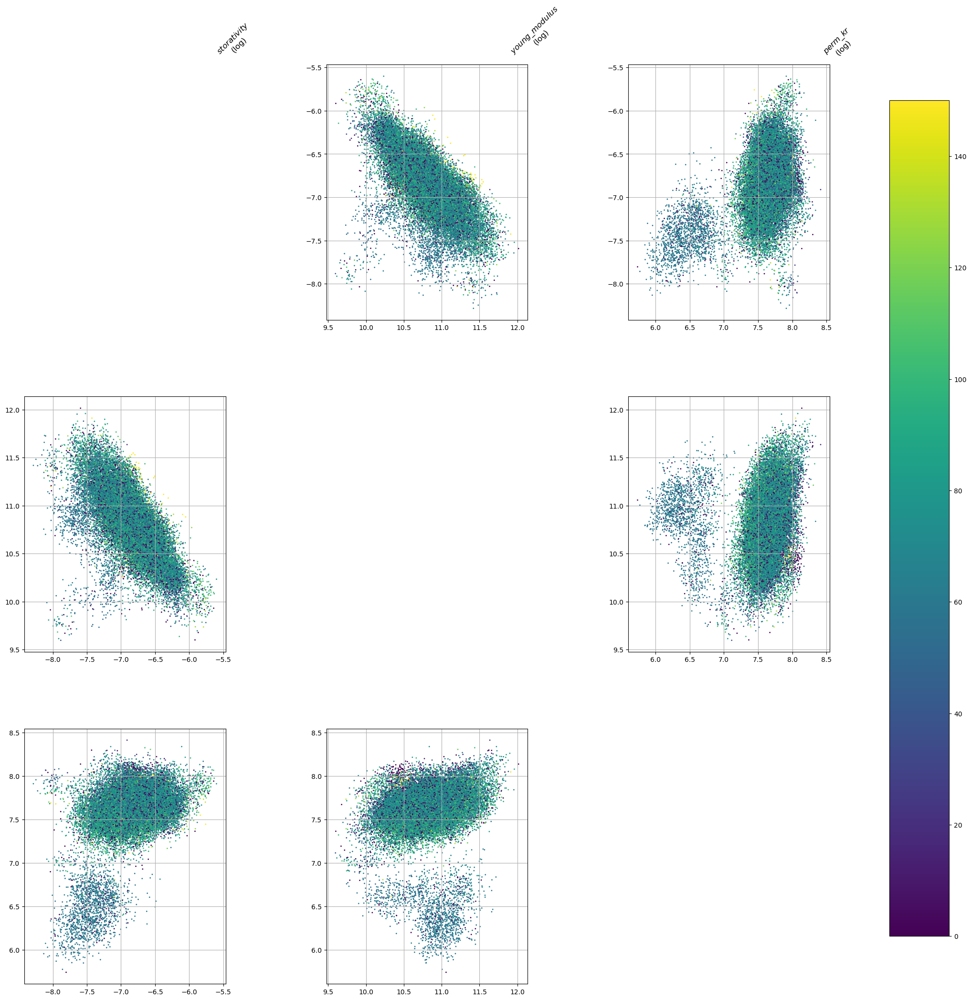

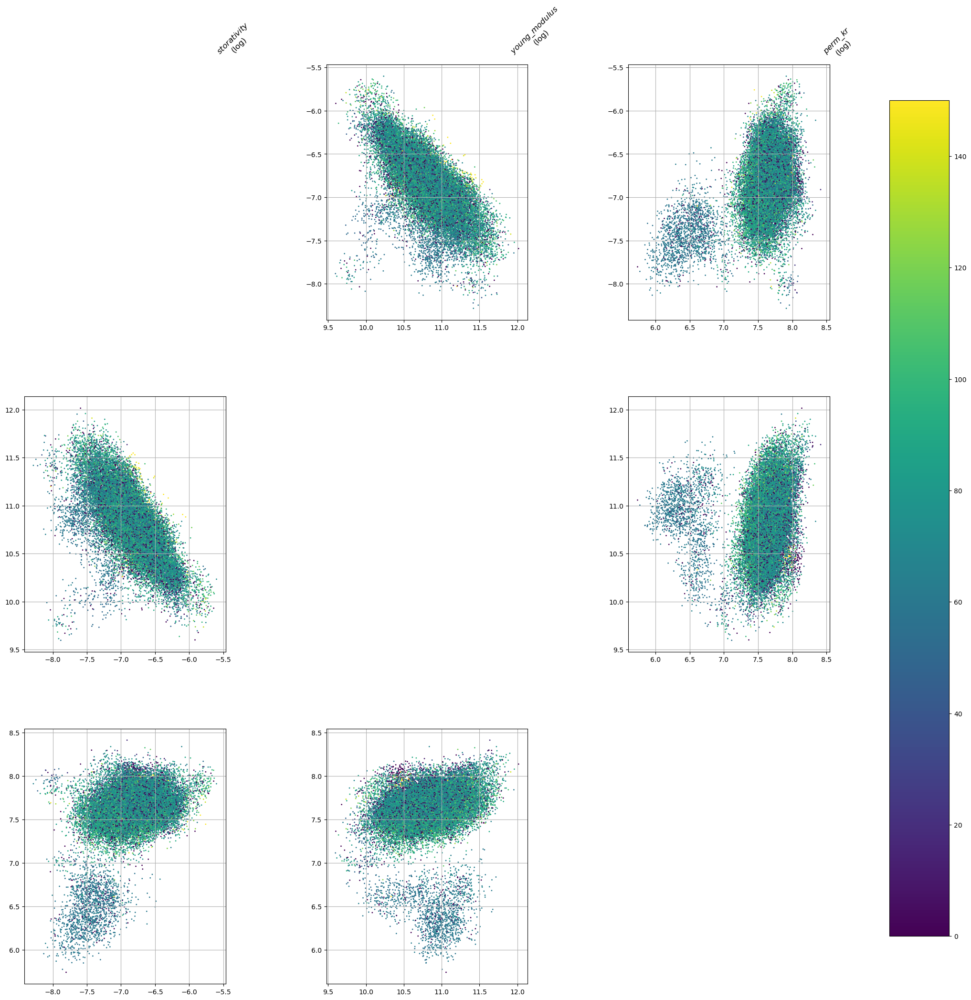

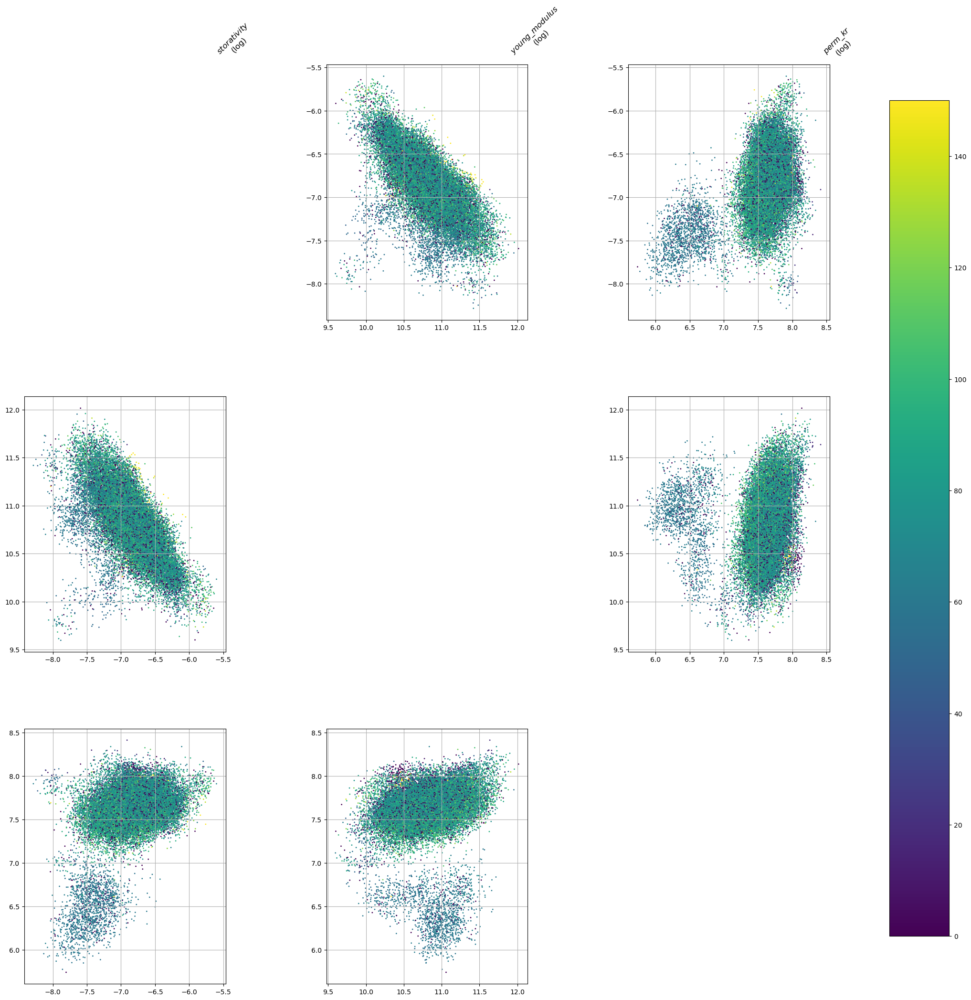

In [17]:
### PREPARATION:
S = va.Samples()
no_parameters = conf["no_parameters"]
scale = ["linear"]*no_parameters
if "transformations" in conf.keys():
    transformations = conf["transformations"]
    for i in range(no_parameters):
        if transformations[i]["type"] == "normal_to_lognormal":
            scale[i] = "log"
S.load_notes(output_dir,no_samplers)
S.load_MH(output_dir,no_parameters)
S.calculate_properties()
S.load_MH_with_posterior(output_dir,no_parameters)

# output_file = os.path.join(output_dir, "output.txt")
# sys.stdout = open(output_file, "w")

output_dict = S.get_properties(no_samplers)
#samplers_list = conf["samplers_list"]
title = ",".join([str(i) for i in S.notes[0].columns.values])
for idx,d in enumerate(output_dict["samplers_list"]):
    count_list = np.array(S.notes[idx].values.tolist())
    count_list = count_list.sum(axis=0)

    d[title] = S.notes[idx].values.tolist()
    d["acceptance ratio [a/r, a/all]"] = np.array([count_list[0]/count_list[1], count_list[0]/count_list[3]]).tolist()
    d["N samples [a, r, pr, all]"] = np.array(
        [count_list[0], count_list[1], count_list[2], count_list[3]]).tolist()
    d.update(conf["samplers_list"][idx])

mode = S.find_modus()
output_dict["mode"] = mode[0].tolist()


raw_data = ape.RawData()
raw_data.load(output_dir, no_parameters, len(observations))
# type: 0-accepted, 1-prerejected, 2-rejected
raw_data_filtered = raw_data.filter(types=[0,2], stages=range(no_stages+1))
raw_data_accepted = raw_data.filter(types=[0], stages=range(0,no_stages+1))

analysis_pe = ape.Analysis(config=conf, raw_data=raw_data_filtered)


In [ ]:
# fit_L2_x, fit_L2_G, fit_L2_norm = S.find_best_fit(raw_data_dir, no_parameters, observations)
# bestfit_L2, bestfit_L2_norm = analysis_pe.find_best_fit(observations, norm="L2")
fits, norms = analysis_pe.find_n_best_fits(observations, count=20, norm="L2")
bestfit_L2 = fits[0]
bestfit_L2_norm = norms[0]
output_dict["best_fit_L2"] = {"type": bestfit_L2.type_name(),
                              "parameters": bestfit_L2.parameters().tolist(),
                              "parameters_log": np.log(bestfit_L2.parameters()).tolist(),
                              "parameters_log10": np.log10(bestfit_L2.parameters()).tolist()}
bfs = [{"t": f.type_name(), "n": float(n)} for f,n in zip(fits, norms)]
print(bfs)
output_dict["best_fits_L2"] = bfs
print("-----")
print('BEST FIT (L2)')
print(" - NORM:", bestfit_L2_norm)
print(" - PARAMETERS:", bestfit_L2.parameters())
print(" - OBSERVATIONS:", bestfit_L2.observations())

from surrDAMH.modules import Gaussian_process
noise_cov = Gaussian_process.assemble_covariance_matrix(conf["noise_model"])

# bestfit_LH, bestfit_LH_norm = analysis_pe.find_best_fit(observations, norm="likelihood", noise_cov=noise_cov)
fits, norms = analysis_pe.find_n_best_fits(observations, count=20, norm="likelihood", noise_cov=noise_cov)
bestfit_LH = fits[0]
bestfit_LH_norm = norms[0]
output_dict["best_fit_LH"] = {"type": bestfit_LH.type_name(),
                              "parameters": bestfit_LH.parameters().tolist(),
                              "parameters_log": np.log(bestfit_LH.parameters()).tolist(),
                              "parameters_log10": np.log10(bestfit_LH.parameters()).tolist()}
bfs = [{"t": f.type_name(), "n": float(n)} for f,n in zip(fits, norms)]
print(bfs)
output_dict["best_fits_LH"] = bfs
print("-----")
print('BEST FIT (LikelyHood)')
print(" - NORM:", bestfit_LH_norm)
print(" - PARAMETERS:", bestfit_LH.parameters())
print(" - OBSERVATIONS:", bestfit_LH.observations())

visual = ape.Visualization(conf, raw_data_filtered)
# fig, axes = plt.subplots(1,1)
# visual.plot_likelihood_ij(axes, 0, 1)
# # fig.colorbar(extend="min")
# fig.savefig(os.path.join(visualization_dir, "likelihood_" + str(0) + "_" + str(1) + ".pdf"))
fig, axes = plt.subplots(no_parameters, no_parameters, figsize=(25,25))
plt.subplots_adjust(wspace=0.5, hspace=0.3)
visual.plot_likelihood(fig, axes)
fig.savefig(os.path.join(visualization_dir, "likelihood_all" + ".jpg"))

disp_pars = [0,1,4]
time_axis = conf["noise_model"][0]["time_grid"]
observe_slice_dir = os.path.join(visualization_dir, "observe_slices")
os.makedirs(observe_slice_dir, mode=0o775, exist_ok=True)
for obs_idx in range(10,14):
    time = time_axis[obs_idx]
    fig, axes = plt.subplots(len(disp_pars), len(disp_pars), figsize=(25, 25))
    plt.subplots_adjust(wspace=0.5, hspace=0.3)
    visual.plot_observe_slice(fig, axes, obs_idx, disp_pars)
    fig.savefig(os.path.join(observe_slice_dir, "observe_slice_" + str(time) + ".jpg"))

filter raw data: p (4577, 8)
[{'name': 'storativity', 'mu': 2.1636738834345796e-07, 'mu_log10': -6.794954002776291, 'sigma': 1.8113830077364585e-07, 'sigma_log10': 0.34138307623899533}, {'name': 'young\\_modulus', 'mu': 93904580203.6659, 'mu_log10': 10.832361953355843, 'sigma': 83849049195.14192, 'sigma_log10': 0.3516259297327789}, {'name': 'init\\_stress\\_x', 'mu': 51351516.64701063, 'mu_log10': 7.658754757656119, 'sigma': 23093716.580114592, 'sigma_log10': 0.24368447145870936}, {'name': 'init\\_stress\\_y', 'mu': 7474335.286817776, 'mu_log10': 6.713582767038286, 'sigma': 7048778.663944588, 'sigma_log10': 0.3822175822326046}, {'name': 'perm\\_kr', 'mu': 9.992457228714483e-22, 'mu_log10': -21.271252312594743, 'sigma': 1.6833871360714224e-21, 'sigma_log10': 0.47412298737025454}, {'name': 'perm\\_km', 'mu': 7.328801934818107e-18, 'mu_log10': -17.95331062932163, 'sigma': 4.2191452913622864e-17, 'sigma_log10': 0.7390861900338638}, {'name': 'perm\\_beta', 'mu': 3.2363403779990586e-07, 'mu_

/home/ber0061/Repositories/surrDAMH/surrDAMH/modules/visualization_and_analysis.py:982: RuntimeWarning: invalid value encountered in log
  nd = np.log(np.mean(major_ticks))


mu,sigma: -6.433153326263763 0.8685889638065036
mu,sigma: -6.272309693979829 0.8685889638065036
mu,sigma: -6.947621948337424 0.8685889638065036
mu,sigma: 11.101234554924698 0.8685889638065036
mu,sigma: 7.772943477510077 0.8685889638065036
mu,sigma: 7.041392685158206 0.8685889638065036
mu,sigma: -20.935203305480904 1.3028834457097553
mu,sigma: -17.89079355431514 1.3028834457097553
mu,sigma: -6.433153326263763 0.8685889638065036
mu,sigma: -6.272309693979829 0.8685889638065036


/home/ber0061/Repositories/surrDAMH/surrDAMH/modules/visualization_and_analysis.py:982: RuntimeWarning: invalid value encountered in log
  nd = np.log(np.mean(major_ticks))


observe points: ['H1']
estimated noise std (best_fit-observations) 18.941755431204832


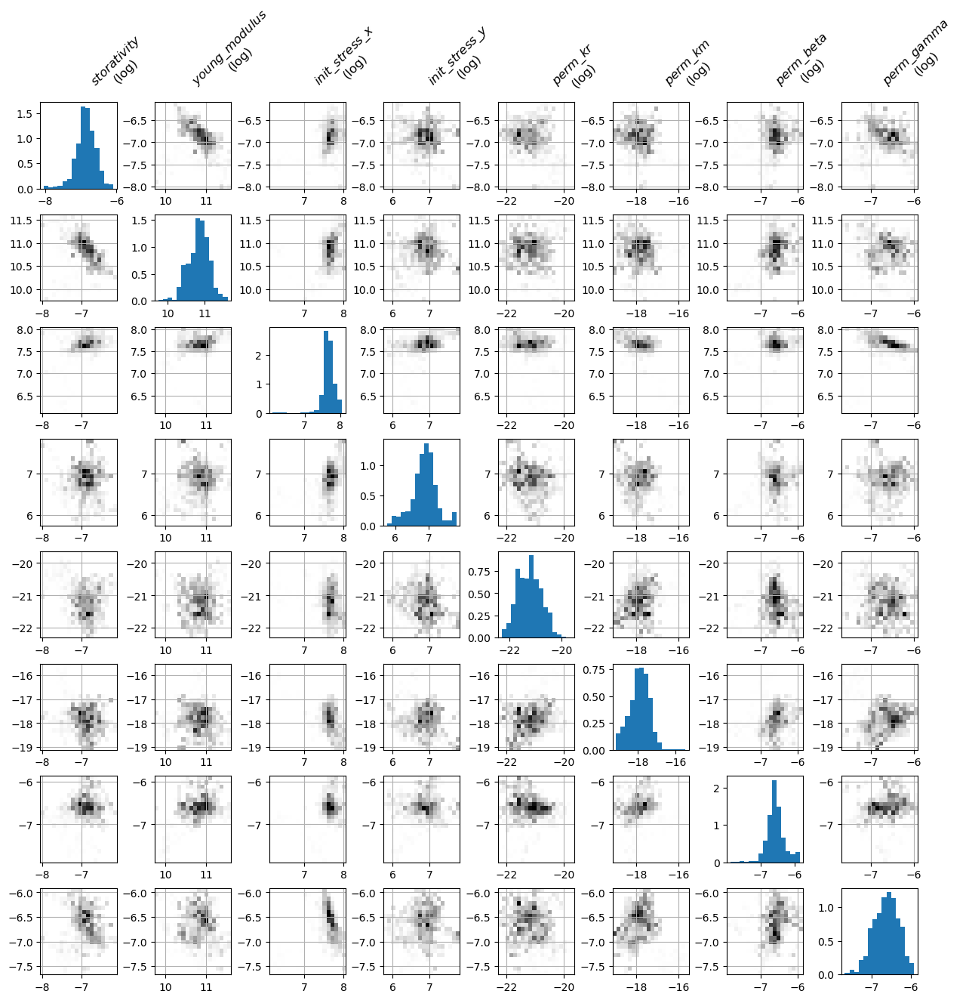

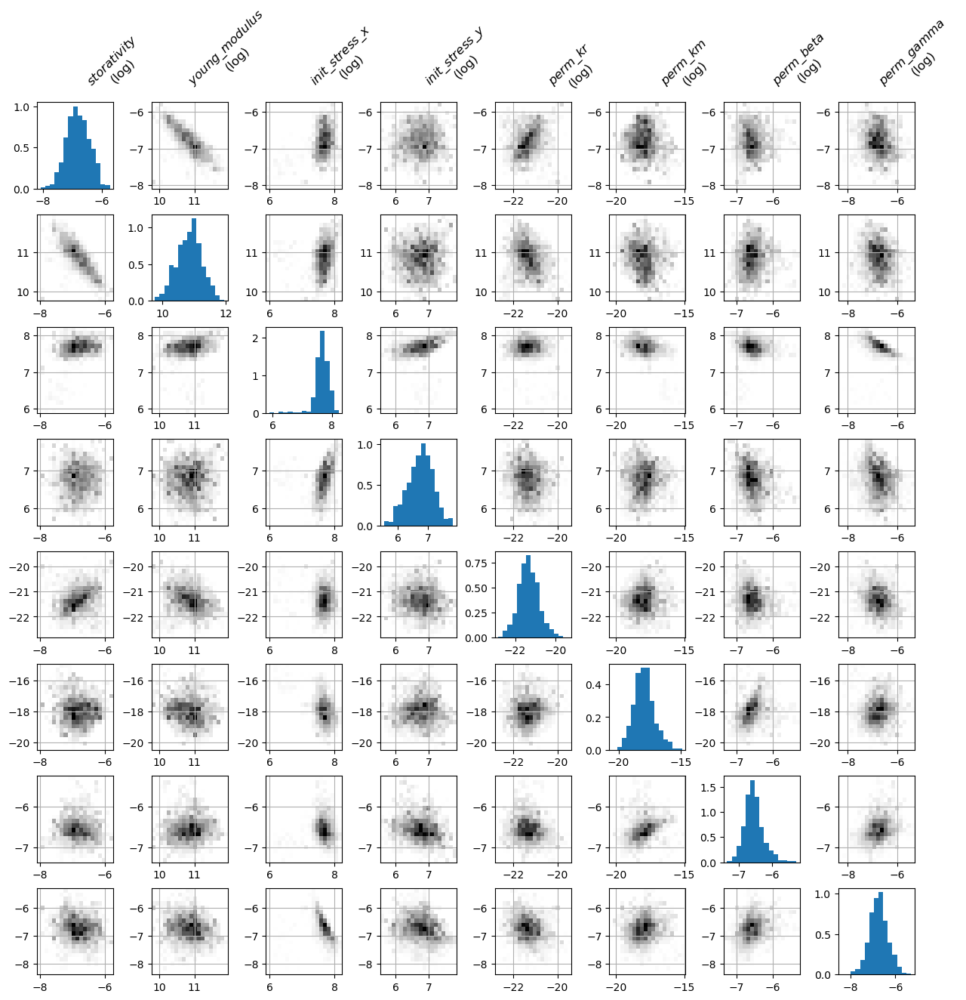

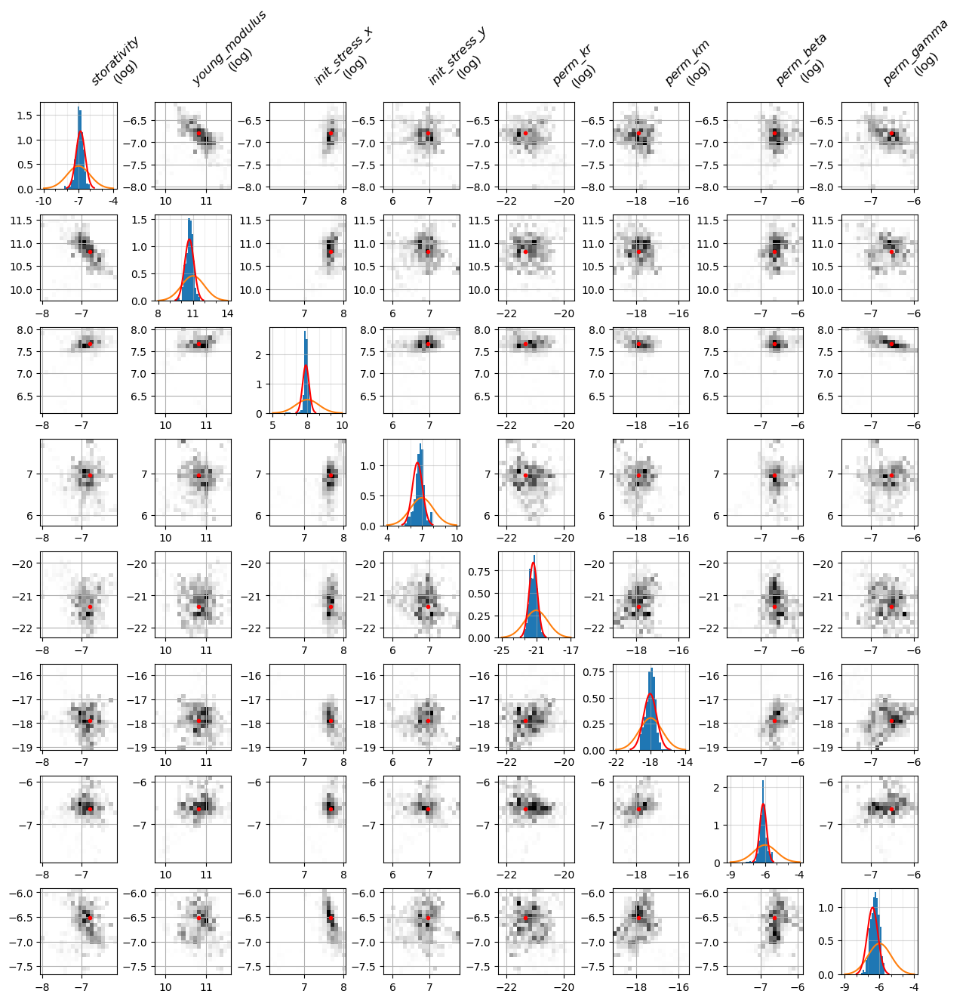

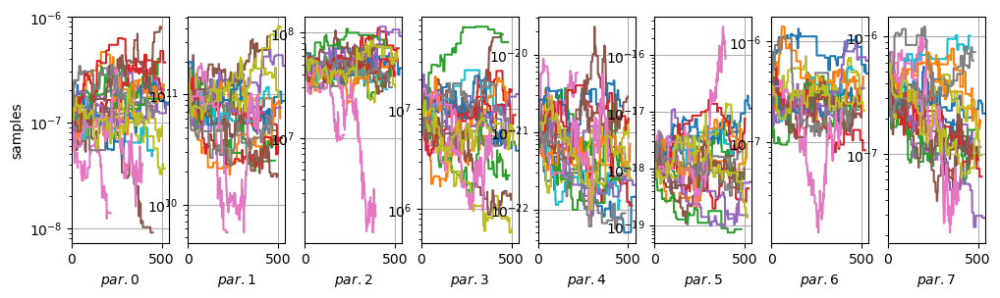

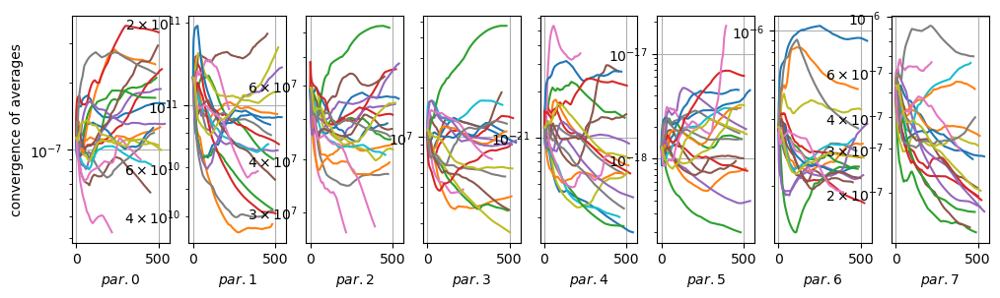

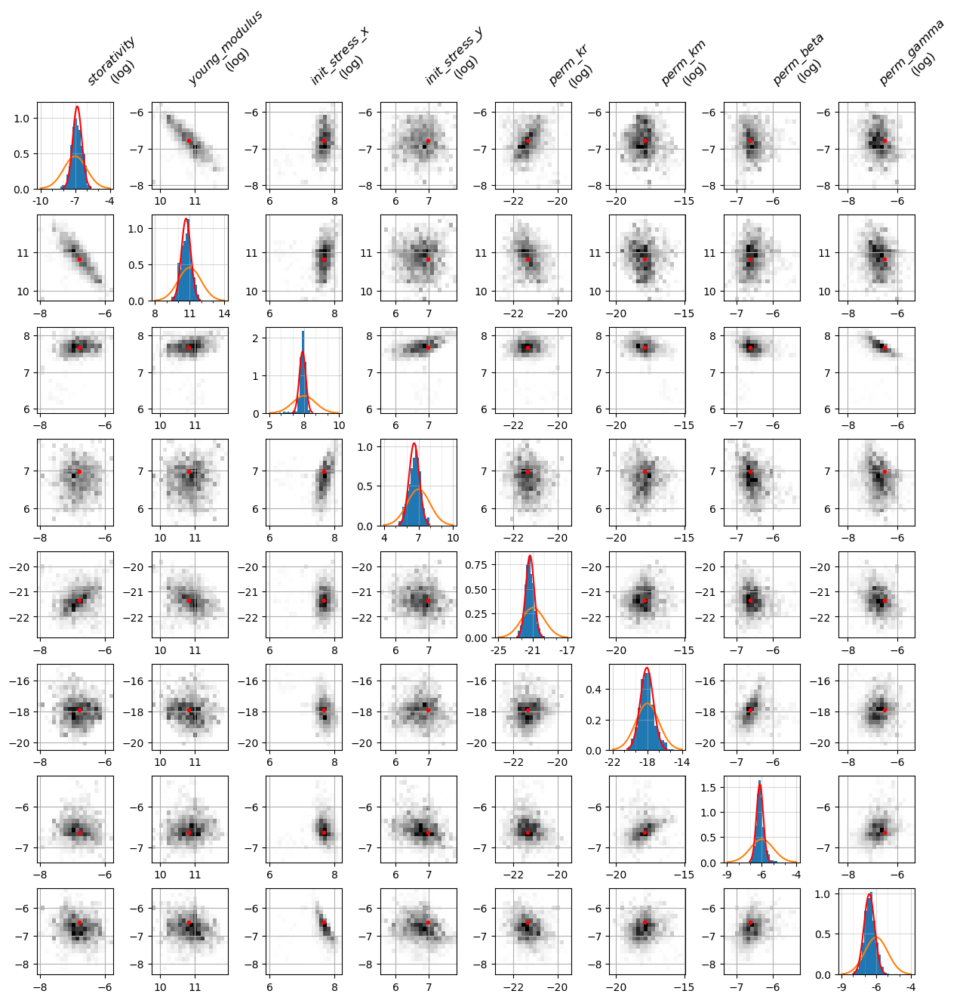

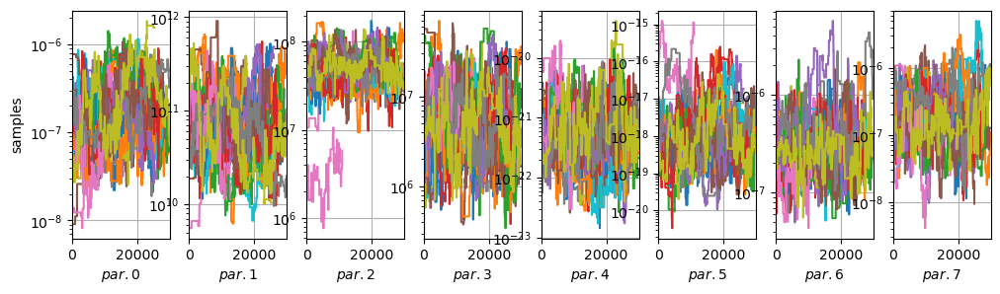

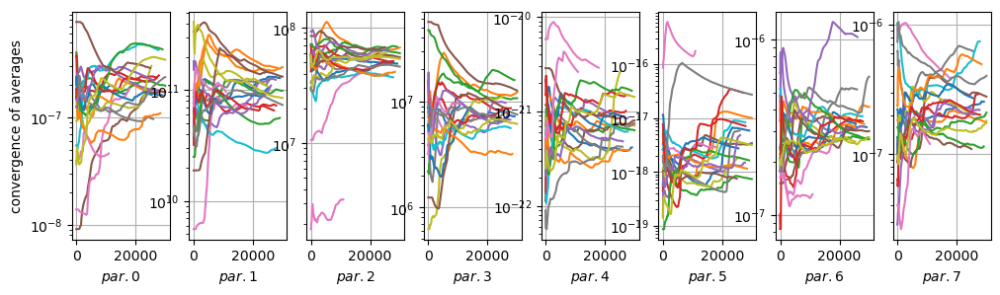

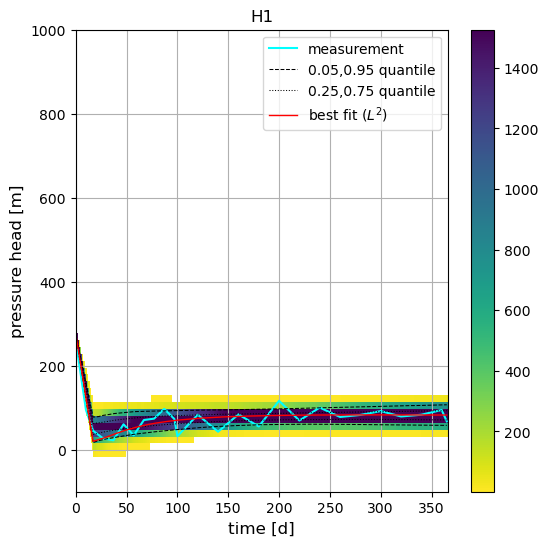

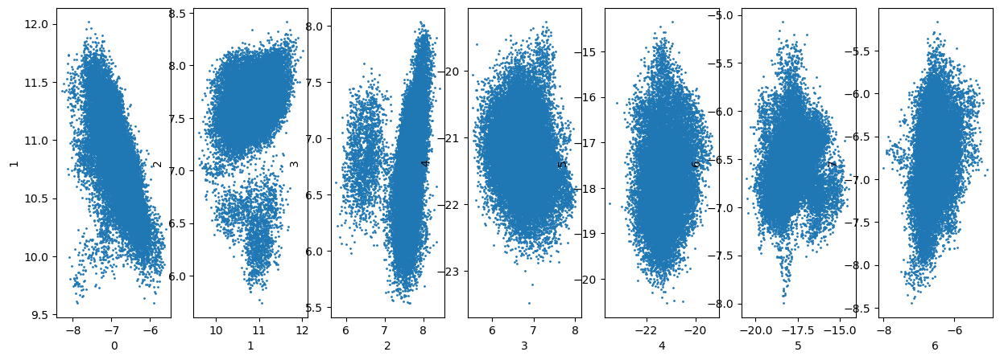

In [18]:

raw_data_accepted_s1p = raw_data.filter(types=[0], stages=range(1,no_stages+1))
# print(raw_data_accepted_s1p.weights)
analysis_pe_accepted = ape.Analysis(config=conf, raw_data=raw_data_accepted_s1p)
estimated_distributions = analysis_pe_accepted.estimate_distributions(
                output_file=os.path.join(visualization_dir, "parameters2.csv"))
print(estimated_distributions)

# collecting samples in the same way as SB does in hist_G_TSX
# estimated_distributions = S.estimate_distributions(raw_data_dir, transformations,
#                                                    chains_disp=chains_disp,
#                                                    output_file=os.path.join(visualization_dir, "parameters.csv"))
# print(estimated_distributions)


for i in range(no_stages):
    raw_data_accepted = raw_data.filter(types=[0], stages=[i])
    temp_vis = ape.Visualization(config=conf, raw_data=raw_data_accepted)
    fig, axes = temp_vis.plot_hist_grid(bins1d=15, bins2d=20)
    fig.savefig(visualization_dir + "/histograms_s" + str(i) + ".pdf", bbox_inches="tight")

print("HISTOGRAMS")
### SAMPLES VISUALIZATION:
for i in range(no_stages):
    chains_disp=range(i*no_samplers,(i+1)*no_samplers)

    fig, axes = S.plot_hist_grid(par_names=par_names, chains_disp=chains_disp, bins1d=15, bins2d=20, scale=scale)
    S.plot_hist_grid_add(axes, transformations, estimated_distributions, chains_disp=chains_disp, scale=scale)
    fig.savefig(visualization_dir + "/histograms" +str(i)+ ".pdf",bbox_inches="tight")

    S.plot_segment(chains_disp=chains_disp,scale=scale)
    plt.savefig(visualization_dir + "/chains" +str(i)+ ".pdf",bbox_inches="tight")
    S.plot_average(chains_disp=chains_disp,scale=scale)
    plt.savefig(visualization_dir + "/average" +str(i)+ ".pdf",bbox_inches="tight")
    # S.plot_dots(chains_disp=chains_disp, scale=scale)
    # plt.savefig(visualization_dir + "/dots" +str(i)+ ".pdf",bbox_inches="tight")

# chains_disp=range(20,60)
# S.plot_hist_grid(chains_disp=chains_disp, bins1d=10, bins2d=20, scale=scale)
# S.plot_hist_grid_add(transformations,chains_disp=chains_disp, scale=scale)
# plt.savefig(visualization_dir + "/histograms2_3.pdf",bbox_inches="tight")

# plt.figure()
# plt.imshow(noise_cov)
# plt.colorbar()
# plt.savefig(visualization_dir + "/noise_cov.pdf",bbox_inches="tight")

pressure_boreholes = conf["observe_points"]
print("observe points:", pressure_boreholes)
N = len(pressure_boreholes)
noise_model_list = conf["noise_model"]
for i in range(N):
    # offset = i*len(grid)
    noise_model = noise_model_list[i]
    time_grid = np.array(noise_model["time_grid"])
    offsets = noise_model["range"]
    S.hist_G_TSX(raw_data_dir, no_parameters, time_grid, observations, np.arange(*offsets), chains_disp)
    plt.title(pressure_boreholes[i])
    plt.savefig(visualization_dir + "/hist_G" + str(i+1) + ".pdf",bbox_inches="tight")

S.show_non_converging(raw_data_dir, no_parameters)
plt.savefig(visualization_dir + "/non_converging.png",bbox_inches="tight")

output_dict["estimated_distributions"] = estimated_distributions
with open(os.path.join(output_dir, "output.yaml"), 'w') as f:
    yaml.dump(output_dict, f, default_flow_style=None)

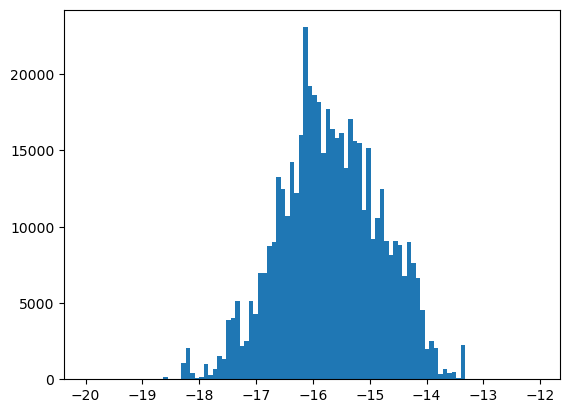

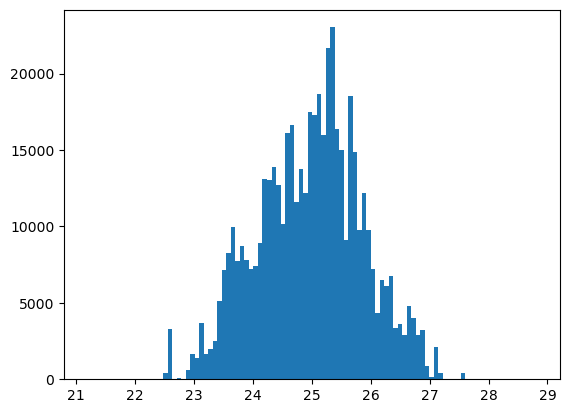

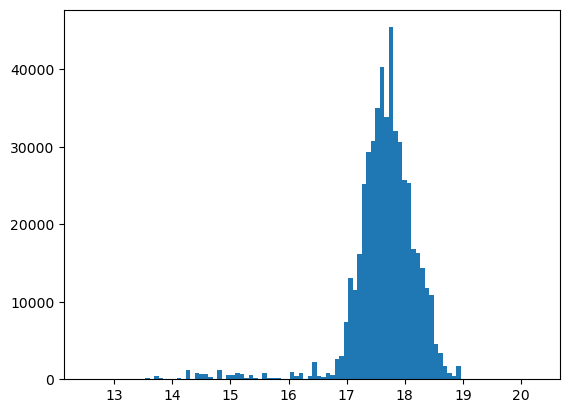

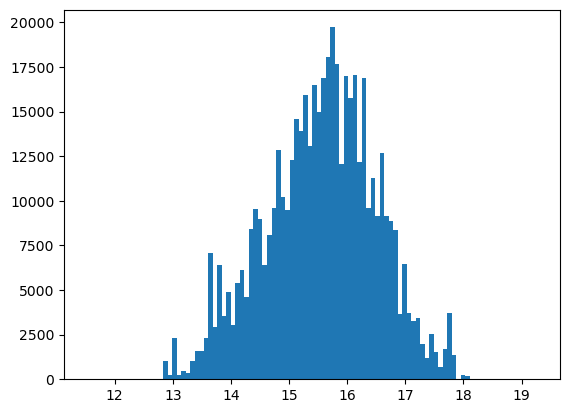

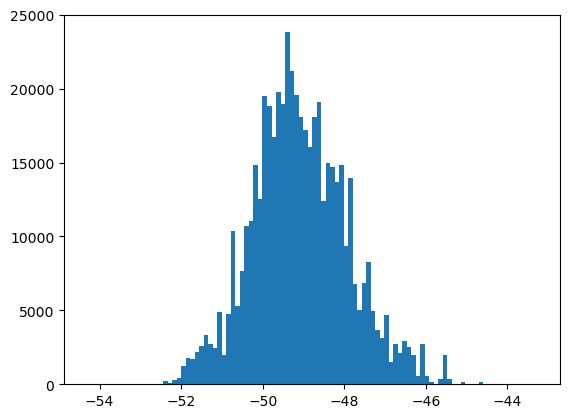

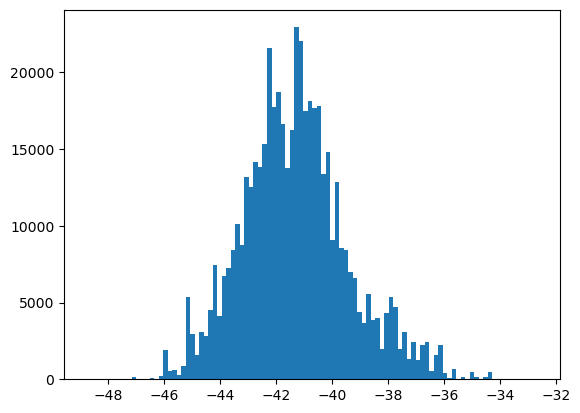

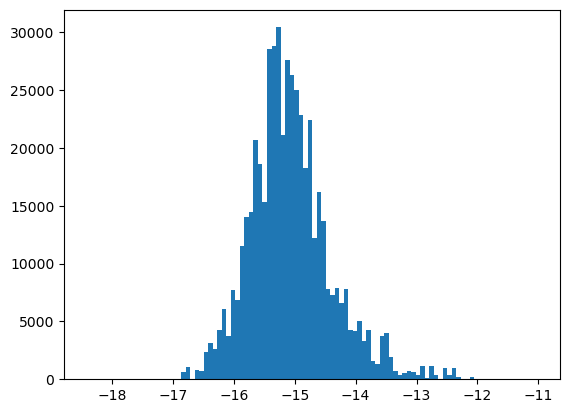

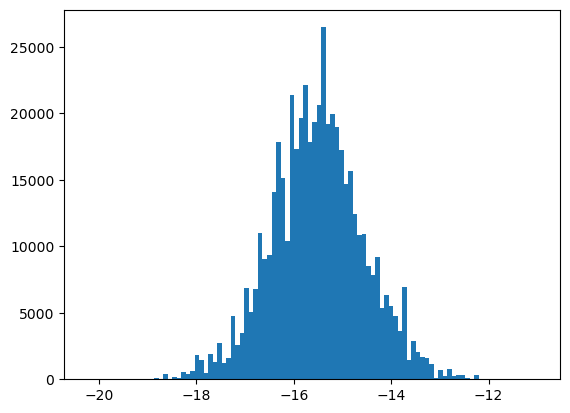

In [63]:

# plot histogram for each column of raw_data.pameters with raw_data.weights
import matplotlib.pyplot as plt

for i in range(no_parameters):
    plt.figure()
    plt.hist(np.log(raw_data.parameters[:,i]), weights=raw_data.weights, bins=100)
    plt.show()

In [22]:
import surrDAMH.modules.surrogate_poly as surrogate_poly

In [25]:
surr_obj = surrogate_poly.Surrogate_update(2,1)

SURROGATE polynomial degree increased to: 1 - no poly: 3


In [24]:
import numpy as np
n=10
# generate n x and y points randomly in 0,1 and compute z = x^2 + y^2
x = np.random.rand(n)
y = np.random.rand(n)
z = x**2 + y**2


In [26]:
from surrDAMH.modules.classes_SAMPLER import Snapshot

In [28]:
# for all points in x,y,z create a snapshot as Snapshot(np.array([x,y]),z)

# create a list of snapshots
snapshots = []

for i in range(n):
    snapshots.append(Snapshot(np.array([x[i],y[i]]),z[i]))


In [29]:
surr_obj.add_data(snapshots)

In [34]:
SOL = surr_obj.update()

In [31]:
surr_apply_obj = surrogate_poly.Surrogate_apply(2,1)

In [48]:


surr_apply_obj.apply(SOL[0], np.array([[0.5,0.5],[0.1,0.1]]))

array([[0.49999999],
       [0.01999999]])

In [43]:
datapoints = np.array([[0.5,0.5],[0.1,0.1]])

In [44]:
datapoints = datapoints.reshape(-1,2)
no_datapoints = datapoints.shape[0]  
no_datapoints

2

In [46]:
surr_apply_obj.current_degree = 3

In [47]:
surr_apply_obj.on_degree_change()

In [49]:
SOL

([array([[ 2.00000000e+00],
         [-9.31322575e-09],
         [ 1.86264515e-09],
         [ 1.41421356e+00],
         [ 9.31322575e-10],
         [ 1.41421357e+00],
         [ 2.32830644e-10],
         [ 0.00000000e+00],
         [ 0.00000000e+00],
         [-5.58793545e-09]]),
  3],
 10)